In [8]:
import pyes
import numpy as np
import matplotlib.pyplot as plt

In [9]:
n_dimension = 2
objective = lambda xs: sum([x**2 for x in xs])
n_iter = 100
learn_rate = 0.02
mu = 4
lam = 12
mean=0
sigma=0
random_state = 1 # 固定输出

In [10]:
best_over_gen = []
populations = []

def event_on_generation(gen, population, current_best, history_best):
    populations.append(population)
    if gen == 0:
        best_over_gen.append(objective(current_best))
    else:
        best_over_gen.append(objective(history_best))

In [11]:
pyes.NES(n_dimension, objective, n_iter, learn_rate, lam, mean, sigma, random_state, event_on_generation)

2021-07-10 17:06:39.655 | DEBUG    | pyes.nes:NES:26 - {'dimension': 2, 'n_iter': 100, 'learn_rate': 0.02}


[array([-0.0213635 , -0.05310905], dtype=float32), 0.0032769703242028353]

Text(0, 0.5, 'fitness')

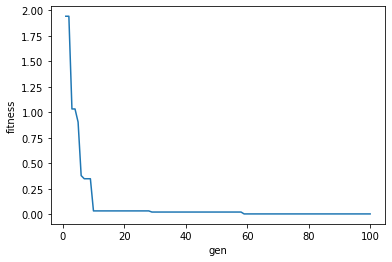

In [12]:
# 适应值作图
plt.plot(np.arange(1, n_iter+1), best_over_gen)
plt.xlabel('gen')
plt.ylabel('fitness')

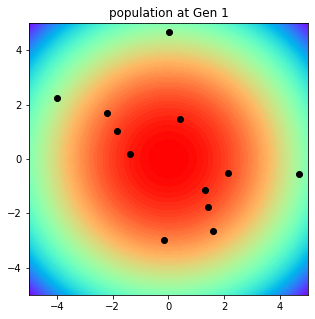

In [13]:
# 第一代个体轨迹
plt.figure(figsize=(5, 5))
plt.title('population at Gen {gen}'.format(gen=1))
n = 300
x = np.linspace(-5, 5, n)
X, Y = np.meshgrid(x, x)
Z = np.zeros_like(X)

for i in range(n):
    for j in range(n):
        Z[i, j] = objective([x[i], x[j]])

plt.contourf(X, Y, -Z, 100, cmap=plt.cm.rainbow)
plt.ylim(-5, 5)
plt.xlim(-5, 5)
plt.ion()
plt.scatter(
    populations[0][:,0],
    populations[0][:,1], c='k')
plt.ioff()
plt.show()

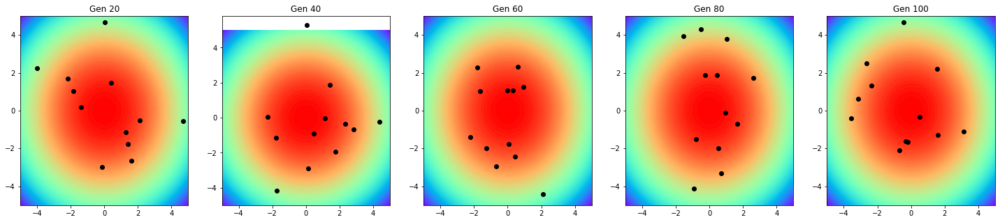

In [14]:
# 种群轨迹作图
fig, axs = plt.subplots(1, 5, figsize=(25, 5))
for i, g in enumerate([19, 39, 59, 79, 99]):
    axs[i].contourf(X, Y, -Z, 100, cmap=plt.cm.rainbow)
    axs[i].set_title('Gen {gen}'.format(gen=g+1))
    axs[i].scatter(populations[i][:,0], populations[i][:,1], c='k')